In [1]:
import pandas as pd

In [2]:
df=pd.read_csv('Data/Real-Data/Real_Combine.csv')
df.head()

,T,TM,Tm,SLP,H,VV,V,VM,PM 2.5
0,7.4,9.8,4.8,1017.6,93.0,0.5,4.3,9.4,219.720833
1,7.8,12.7,4.4,1018.5,87.0,0.6,4.4,11.1,182.187500
2,6.7,13.4,2.4,1019.4,82.0,0.6,4.8,11.1,154.037500
3,8.6,15.5,3.3,1018.7,72.0,0.8,8.1,20.6,223.208333
4,12.4,20.9,4.4,1017.3,61.0,1.3,8.7,22.2,200.645833


In [3]:
df.isna().sum()

T         0
TM        0
Tm        0
SLP       0
H         0
VV        0
V         0
VM        0
PM 2.5    1
dtype: int64

In [4]:
df=df.dropna() # droping nan value from dataframe

In [5]:
X=df.iloc[:,:-1]
y=df.iloc[:,-1]

In [6]:
X.head() # independent Features

,T,TM,Tm,SLP,H,VV,V,VM
0,7.4,9.8,4.8,1017.6,93.0,0.5,4.3,9.4
1,7.8,12.7,4.4,1018.5,87.0,0.6,4.4,11.1
2,6.7,13.4,2.4,1019.4,82.0,0.6,4.8,11.1
3,8.6,15.5,3.3,1018.7,72.0,0.8,8.1,20.6
4,12.4,20.9,4.4,1017.3,61.0,1.3,8.7,22.2


In [7]:
y.head() # dependent features

0    219.720833
1    182.187500
2    154.037500
3    223.208333
4    200.645833
Name: PM 2.5, dtype: float64

In [8]:
df.corr()

,T,TM,Tm,SLP,H,VV,V,VM,PM 2.5
T,1.000000,0.967276,0.958892,-0.884383,-0.518870,0.622637,0.326067,0.287138,-0.628336
TM,0.967276,1.000000,0.896699,-0.829254,-0.599629,0.598479,0.320116,0.299508,-0.569381
Tm,0.958892,0.896699,1.000000,-0.909514,-0.315305,0.560299,0.312904,0.259431,-0.669059
SLP,-0.884383,-0.829254,-0.909514,1.000000,0.274196,-0.491842,-0.346130,-0.299830,0.615615
H,-0.518870,-0.599629,-0.315305,0.274196,1.000000,-0.475279,-0.399079,-0.370981,0.174658
VV,0.622637,0.598479,0.560299,-0.491842,-0.475279,1.000000,0.402884,0.347493,-0.628621
V,0.326067,0.320116,0.312904,-0.346130,-0.399079,0.402884,1.000000,0.760777,-0.354799
VM,0.287138,0.299508,0.259431,-0.299830,-0.370981,0.347493,0.760777,1.000000,-0.283695
PM 2.5,-0.628336,-0.569381,-0.669059,0.615615,0.174658,-0.628621,-0.354799,-0.283695,1.000000


In [9]:
import seaborn as sns
import matplotlib.pyplot as plt

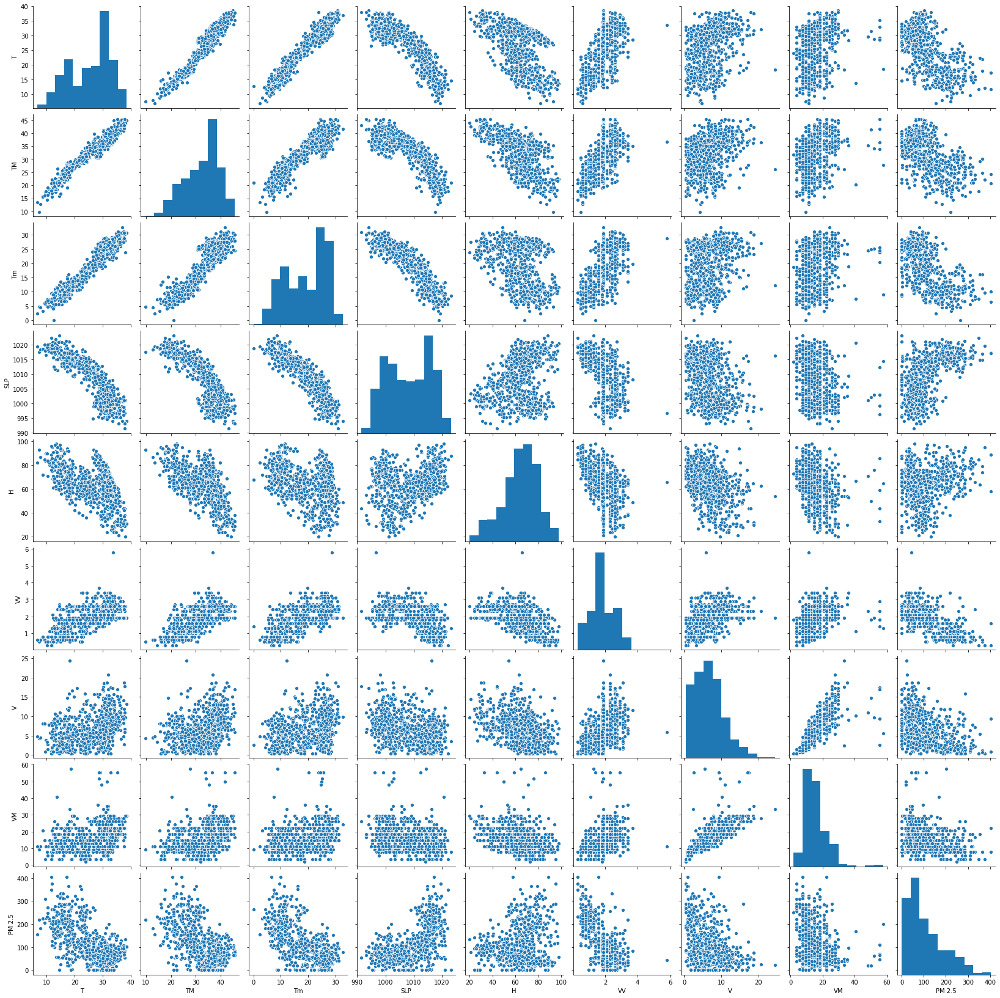

In [10]:
sns.pairplot(df)

# Co-Relational Matrix With Heatmap

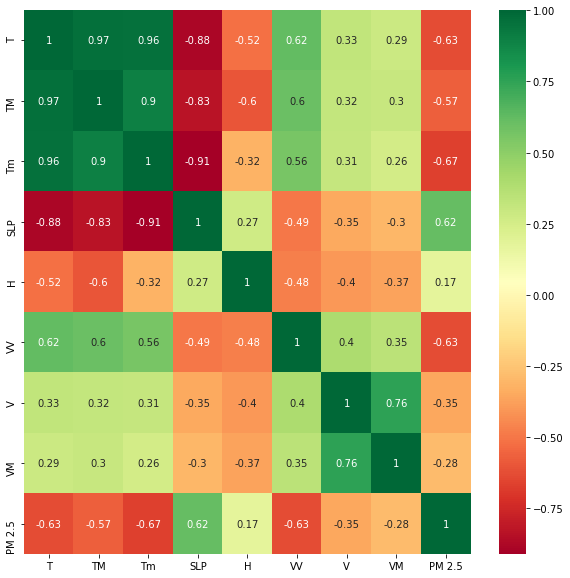

In [11]:
cormat=df.corr()
features_index=cormat.index
plt.figure(figsize=(10,10)),
sns.heatmap(df[features_index].corr(),annot=True,cmap='RdYlGn')

In [12]:
df.corr().index

Index(['T', 'TM', 'Tm', 'SLP', 'H', 'VV', 'V', 'VM', 'PM 2.5'], dtype='object')

# Feature Important

In [13]:
from sklearn.ensemble import ExtraTreesRegressor
model=ExtraTreesRegressor()
model.fit(X,y)

ExtraTreesRegressor()

In [14]:
print(model.feature_importances_)

[0.17295149 0.07347907 0.17809503 0.15378204 0.08332137 0.24737941
 0.05281606 0.03817553]


In [15]:
feature_importance=pd.Series(model.feature_importances_,index=X.columns)

In [16]:
feature_importance

T      0.172951
TM     0.073479
Tm     0.178095
SLP    0.153782
H      0.083321
VV     0.247379
V      0.052816
VM     0.038176
dtype: float64

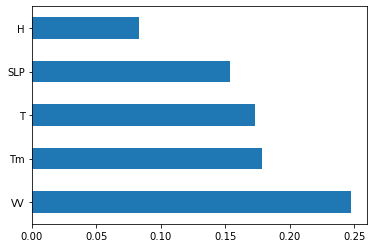

In [17]:
feature_importance.nlargest(5).plot(kind='barh')
plt.show()

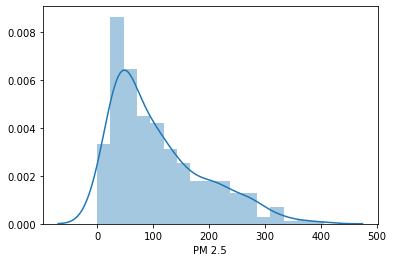

In [18]:
sns.distplot(y)

# train_test_split

In [19]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(X,y,test_size=0.3,random_state=0)

In [20]:
from sklearn.tree import DecisionTreeRegressor

In [21]:
dtree=DecisionTreeRegressor()

In [22]:
dtree.fit(x_train,y_train)

DecisionTreeRegressor()

In [23]:
print("Coefficient of determination R^2 <----- train_set {} ".format(dtree.score(x_train,y_train)))

Coefficient of determination R^2 <----- train_set 1.0 


In [24]:
print("Coefficient of determination R^2 <----- test_set {} ".format(dtree.score(x_test,y_test)))

Coefficient of determination R^2 <----- test_set 0.3833960794033632 


In [25]:
from sklearn.model_selection import cross_val_score

In [26]:
score=cross_val_score(dtree,X,y,cv=5)

In [27]:
score.mean() # Overfitting problem

0.03721525868251454

# Tree Visualization

##### Scikit learn actually has some built-in-visualization capabilities for decision trees, you won't use this often and it requires you to install the pydot library but here is an example of what it look like and the code to execute this :
----> You needs to Install Two library
      go to anaconda_prompt
      > conda install pydotplus # it will help you to display the graph of the decision tree
      > conda install python-graphviz

In [28]:
from IPython.display import Image
from six import StringIO 
from sklearn.tree import export_graphviz
import pydotplus

In [29]:
features=list(df.columns[:-1])
features

['T', 'TM', 'Tm', 'SLP', 'H', 'VV', 'V', 'VM']

In [30]:
import os
os.environ['PATH'] = os.environ['PATH']+';'+os.environ['CONDA_PREFIX']+r"\Library\bin\graphviz"

In [31]:
dot_data=StringIO()
export_graphviz(dtree,out_file=dot_data,feature_names=features,filled=True,rounded=True)

graph=pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())

# Model Evaluation

In [32]:
prediction=dtree.predict(x_test)

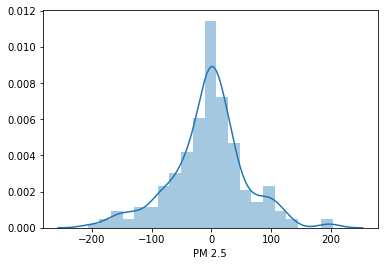

In [33]:
sns.distplot(y_test-prediction)

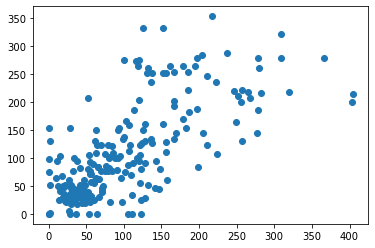

In [34]:
plt.scatter(y_test,prediction)

### Hyperparameter Tuning Decision Tree Regressor

In [35]:
DecisionTreeRegressor()

DecisionTreeRegressor()

In [41]:
## Hyper Parameter Optimization

params={
 "splitter"    : ["best","random"] ,
 "max_depth"        : [ 3, 4, 5, 6, 8, 10, 12, 15],
 "min_samples_leaf" : [ 1,2,3,4,5 ],
"min_weight_fraction_leaf":[0.1,0.2,0.3,0.4],
 "max_features" : ["auto","log2","sqrt",None ],
    "max_leaf_nodes":[None,10,20,30,40,50,60,70]
    
}


In [42]:
## Hyperparameter optimization using GridSearchCV
from sklearn.model_selection import GridSearchCV

In [43]:
random_search=GridSearchCV(dtree,param_grid=params,scoring='neg_mean_squared_error',n_jobs=-1,cv=10,verbose=3)

In [44]:
def timer(start_time=None):
    if not start_time:
        start_time = datetime.now()
        return start_time
    elif start_time:
        thour, temp_sec = divmod((datetime.now() - start_time).total_seconds(), 3600)
        tmin, tsec = divmod(temp_sec, 60)
        print('\n Time taken: %i hours %i minutes and %s seconds.' % (thour, tmin, round(tsec, 2)))

In [45]:
from datetime import datetime
# Here we go
start_time = timer(None) # timing starts from this point for "start_time" variable
random_search.fit(X,y)
timer(start_time) # timing ends here for "start_time" variable

Fitting 10 folds for each of 10240 candidates, totalling 102400 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done 528 tasks      | elapsed:    3.4s
[Parallel(n_jobs=-1)]: Done 5648 tasks      | elapsed:   10.9s
[Parallel(n_jobs=-1)]: Done 12816 tasks      | elapsed:   21.9s
[Parallel(n_jobs=-1)]: Done 22032 tasks      | elapsed:   37.7s
[Parallel(n_jobs=-1)]: Done 33296 tasks      | elapsed:   58.1s
[Parallel(n_jobs=-1)]: Done 46608 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 61968 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 79376 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 98832 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 102385 out of 102400 | elapsed:  3.2min remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 102400 out of 102400 | elapsed:  3.2min finished



 Time taken: 0 hours 3 minutes and 10.42 seconds.


In [46]:
random_search.best_params_

{'max_depth': 3,
 'max_features': 'sqrt',
 'max_leaf_nodes': None,
 'min_samples_leaf': 4,
 'min_weight_fraction_leaf': 0.1,
 'splitter': 'best'}

In [47]:
dt_predictions=random_search.predict(x_test)

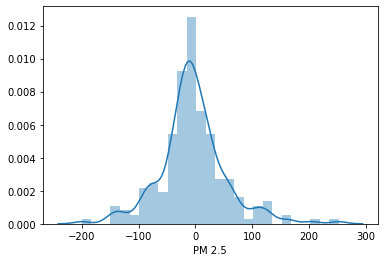

In [50]:
sns.distplot(y_test-dt_predictions)

In [58]:
from sklearn import metrics
import numpy as np
print('MAE:', metrics.mean_absolute_error(y_test, dt_predictions))
print('MSE:', metrics.mean_squared_error(y_test, dt_predictions))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, dt_predictions)))

MAE: 42.1995919918849
MSE: 3554.4074993172894
RMSE: 59.61885187855675


In [60]:
import pickle

In [61]:
file=open('decision_regression_model.pkl','wb')# open a file, where you ant to store the data

In [62]:
pickle.dump(random_search,file)# dump information to that file